# Toy data generation for developing EHT periodicity tests

MJ Rose with Dan Marrone, 2018 

This code takes a hotspot simulation, a 'quiescent' flux simulation, and a 'noisy' simulation and combines them with variable ratios. It also adjusts the hotspot orbital period. It is meant to generate toy data for developing statistical tests that can retrieve the hotspot orbital period parameter and/or the 'quiescent' flux variabilty for different levels of noise. It uses the EHT-imaging package which has updates that are not backward compatible/are buggy (just a warning).  

In [1]:
"""
EHT toy data generation
author: MJ Rose
email: mjrose@email.arizona.edu
website: https://github.com/meljrose
"""

%matplotlib inline
from local_tools.generation import *
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib import animation
import base64
from IPython.display import HTML

SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # default
plt.rc('axes', titlesize=BIGGER_SIZE)     # axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    #  x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    
plt.rc('legend', fontsize=SMALL_SIZE)    # legend 
plt.rc('figure', titlesize=BIGGER_SIZE)  # figure title

from __future__ import division
from __future__ import print_function
import sys, io, os
import numpy as np
from scipy import interpolate
import pandas as pd
import h5py
import copy
import pickle
sys.path.insert(0,'../../eht-imaging') # or wherever you've installed eht-imaging
import ehtim as eh
from local_tools.generation import *

# "Hotspot" Simulation

Here we take our spline representation of a 'hotspot' (../data/raw/hot_spot_only.h5) which we processed in 0_data_prep.ipynb. With it, we generate frames for a 60 second movie that we load into eht-imaging's movie object. This example illustrates what the sampled hotspot movies look like in real time (so if you set movie_duration to anything longer than a few min, you'll probably get bored). 

In [2]:
# all of these are in seconds
movie_duration =  6* 60 * 60 
hotspot_period1 = 30 * 60 
hotspot_period2 = 4 * 60 * 60
hotspot_frames1 = generate_hotspot_frames(hotspot_period1, movie_duration)
hotspot_frames2 = generate_hotspot_frames(hotspot_period2, movie_duration)
framedur = movie_duration/1024. # 1024 is our simulation size. If you want less, you have to alter 0_data_prep.ipynb
                                # for the 'quiescent' simulation and specify in generate_hotspot_frames()
                                # if you want more, you need different simulations
# now we pass our frames to eht-imaging's movie object
# we want the pixel size so that the source is ~50 microarcsec across
M_unit = np.sqrt(27)* eh.RADPERUAS
pixel = 128 * M_unit/512.
ra = 17.761122472222223
dec = -28.992189444444445
hotspot_movie1 = eh.movie.Movie(hotspot_frames1, framedur=framedur,psize=pixel,ra=ra, dec=dec)
hotspot_movie2 = eh.movie.Movie(hotspot_frames2, framedur=framedur,psize=pixel,ra=ra, dec=dec)

generating 21600.00 sec movie at frame rate of 0.05 /sec
generating 21600.00 sec movie at frame rate of 0.05 /sec


In [3]:
# let's look at one of the two eht-imaging hotspot movies we just made
hotspot_movie1.export_mp4('hotspot_movie1.mp4', fps=1.0/framedur* 1000)
video = io.open('hotspot_movie1.mp4', 'r+b').read()
encoded = base64.b64encode(video)
plt.close()
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))        

In [4]:
# if you want to start the hotspot cycle at a different time, you can adjust hotspot_offset to the fraction
# of the cycle you want to start at (30% through would be 0.3)
offset = 0.7
rolled_frames = roll_frames(hotspot_frames1, offset)
movie1 = hotspot_frames1
movie2 = rolled_frames

fig = plt.figure(figsize=(10,5))
fig.suptitle('Rolled hotspot period', size=20)
gs = gridspec.GridSpec(1,2)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax2.set_title('offset {0:.2f} %'.format(offset*100))
ax1.set_title('original')
imag1 = ax1.imshow(movie1[0], origin="lower")
imag2 = ax2.imshow(movie2[0], origin="lower")

def animate(i):
    try:
        imag1.set_data(movie1[i])
    except:
        imag1.set_data(movie1[0])
    try:
        imag2.set_data(movie2[i])
    except:
        imag2.set_data(movie2[0])
    return imag1,

# interval is given in milisecs
anim = animation.FuncAnimation(fig, animate, frames=len(movie1), interval=movie_duration/1024, blit=True)
plt.close()
HTML(anim.to_html5_video())

# 'Quiescent' flux simulation

This simulation (../data/raw/Esim.h5) is Model E discussed in (<a href='https://arxiv.org/pdf/1610.03505.pdf'>Medeiros et al. 2016</a>).

In [5]:
sim_frames = open_hdf5('../data/interim/trimmed_sim.h5')
sim_movie = eh.movie.Movie(sim_frames, framedur=framedur, psize=pixel,ra=ra, dec=dec)

In [6]:
sim_movie.export_mp4('new_sim.mp4', fps=1.0/framedur* 1000)
video = io.open('new_sim.mp4', 'r+b').read()
encoded = base64.b64encode(video)
plt.close()
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))        

# 'Hotspot' + 'Quiescent' 

In [7]:
hotspot_ratio = 0.2 # between 0 (no hotspot) and 1.0 (all hotspot)
combined_frames1 = combine_frames(sim_frames, hotspot_frames1, hotspot_ratio)
hotspot_ratio = 0.9 
combined_frames2 = combine_frames(sim_frames, hotspot_frames2, hotspot_ratio)

# scale to 3.5 Jy
mean_flux = 3.5
combined_frames1 = scale_frames(mean_flux, combined_frames1)
combined_frames2 = scale_frames(mean_flux, combined_frames2)

In [8]:
movie1 = combined_frames1
movie2 = combined_frames2

fig = plt.figure(figsize=(10,5))
fig.suptitle('hotspot + quiescent flux', y=1.001, size=20)
gs = gridspec.GridSpec(1,2)
gs.update(wspace=0.5)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax1.set_title('{0:.2f} hr period, \n quiescent flux dominant'.format(hotspot_period1/3600))
ax2.set_title('{0:.2f} hr period, \n hotspot dominant'.format(hotspot_period2/3600))
imag1 = ax1.imshow(movie1[0], origin="lower")
imag2 = ax2.imshow(movie2[0], origin="lower")


annotation1 = ax1.annotate("", (0.56, 0.9), textcoords='axes fraction', size=20, weight = 'bold')
annotation1.set_animated(True)
annotation2 = ax2.annotate("", (0.56, 0.9), textcoords='axes fraction', size=20, weight = 'bold')
annotation2.set_animated(True)

def init():
    return annotation1, annotation2

def animate(i):
    try:
        imag1.set_data(movie1[i])
        annotation1._text = '{0:.2f} hrs'.format(i * movie_duration/1024./3600. )
    except:
        imag1.set_data(movie1[0])
    try:
        imag2.set_data(movie2[i])
        annotation2._text = '{0:.2f} hrs'.format(i * movie_duration/1024./3600. )
    except:
        imag2.set_data(movie2[0])
    return annotation1, annotation2

# interval is given in milisecs
anim = animation.FuncAnimation(fig, animate, frames=1024, interval=30, blit=True)
plt.close()
HTML(anim.to_html5_video())

# Observations using eht-imaging

In [9]:
# put our frames into eht-im's movie object
combined_movie1 = eh.movie.Movie(combined_frames1, framedur=framedur, psize=pixel,ra=ra, dec=dec)
combined_movie2 = eh.movie.Movie(combined_frames2, framedur=framedur, psize=pixel,ra=ra, dec=dec)

In [10]:
# load a vex file, one of the observation scheduling format files
vex = eh.io.load.load_vex('../data/raw/testa.vex') # from the eht wiki

# this is what a vex schedule looks like
print(vex.sched[0], '\n', '\n', vex.sched[1])
vex_duration = vex.sched[-1]['start_hr']+vex.sched[-1]['scan'][0]['scan_sec'] /3600. - vex.sched[0]['start_hr']
print('\n', 'vex file lasts', vex_duration, 'hours')

sites = []
for i in np.arange(len(vex.sched)):
    for j in np.arange(len(vex.sched[i]['scan'])):
        sites.append(vex.sched[i]['scan'][j]['site'])
sites = set(sites)
print('and uses these sites: ', sites)


Loading vexfile:  ../data/raw/testa.vex
{'scan': {0: {'site': 'ALMA', 'scan_sec_start': 0.0, 'scan_sec': 480.0, 'data_size': 0.0}, 1: {'site': 'APEX', 'scan_sec_start': 0.0, 'scan_sec': 480.0, 'data_size': 0.0}, 2: {'site': 'PICOVEL', 'scan_sec_start': 0.0, 'scan_sec': 480.0, 'data_size': 0.0}, 3: {'site': 'SPT', 'scan_sec_start': 0.0, 'scan_sec': 480.0, 'data_size': 0.0}}, 'mjd_floor': 58230.0, 'start_hr': 3.1666666666666665, 'mode': '1mmlcp', 'source': 'SGRA'} 
 
 {'scan': {0: {'site': 'ALMA', 'scan_sec_start': 0.0, 'scan_sec': 540.0, 'data_size': 492.306}, 1: {'site': 'APEX', 'scan_sec_start': 0.0, 'scan_sec': 540.0, 'data_size': 492.306}, 2: {'site': 'PICOVEL', 'scan_sec_start': 0.0, 'scan_sec': 540.0, 'data_size': 492.306}, 3: {'site': 'SPT', 'scan_sec_start': 0.0, 'scan_sec': 540.0, 'data_size': 492.306}}, 'mjd_floor': 58230.0, 'start_hr': 3.35, 'mode': '1mmlcp', 'source': 'SGRA'}

 vex file lasts 10.116666666666667 hours
and uses these sites:  {'SMTO', 'SMAP', 'PICOVEL', 'APEX'

In [11]:
# This schedule has gaps for calibration and lasts for ~ 10 hours. 
# For this example, let's first get rid of the calibration gaps and 
# then resize the scan times to fit our movie_duration variable
continuous_vex = make_vex_continuous(vex)
scaled_continuous_vex = scale_vex_obstime(continuous_vex, movie_duration)
scaled_continuous_vex_duration = scaled_continuous_vex.sched[-1]['start_hr']+scaled_continuous_vex.sched[-1]['scan'][0]['scan_sec'] /3600. - scaled_continuous_vex.sched[0]['start_hr']
print('\n', 'continuous_vex file now lasts', scaled_continuous_vex_duration, 'hours')
print(' which is ', scaled_continuous_vex_duration*3600., 'seconds')


 continuous_vex file now lasts 6.0000000000000036 hours
 which is  21600.000000000015 seconds


In [12]:
# if you want, you can remove certain telescopes from the vex file with this function
test_vex = remove_telescope(scaled_continuous_vex, 'LMT')
# see if it worked
sites = []
for i in np.arange(len(test_vex.sched)):
    for j in np.arange(len(test_vex.sched[i]['scan'])):
        try:
            sites.append(test_vex.sched[i]['scan'][j]['site'])
        except:
            sites.append(test_vex.sched[i]['scan'][j+1]['site'])
sites = set(sites)
print('now we have these sites: ', sites)

now we have these sites:  {'SMTO', 'PICOVEL', 'APEX', 'JCMT', 'ALMA', 'SPT'}


In [13]:
%%capture
# using %%capture is cell magic that keeps functions from printing out to the notebook (including errors). 
# When you observe with eht-im, it prints out tons of stuff which you can see if you remove '%%capture'

# Now we use eht-imaging to observe the quiescent flux + hotspot without any noise included
# Later, we'll generate an observation of just noise
# having them seperate lets us vary how we combine the two 
no_noise_obs1 = combined_movie1.observe_vex(scaled_continuous_vex, 'SGRA', t_int=framedur, synchronize_start=True, 
                              sgrscat=False, add_th_noise=False,
                              opacitycal=True, ampcal=True, phasecal=True, frcal=True, dcal=True,
                              jones=False, inv_jones=False)

no_noise_obs2 = combined_movie2.observe_vex(scaled_continuous_vex, 'SGRA', t_int=framedur, synchronize_start=True, 
                              sgrscat=False, add_th_noise=False,
                              opacitycal=True, ampcal=True, phasecal=True, frcal=True, dcal=True,
                              jones=False, inv_jones=False)

# Noise Observation

In [14]:
%%capture
# dampen sim to very low signal, observe with noise params to get a noisy movie
dampening_factor = 1e-10
just_noise_movie = copy.deepcopy(sim_movie)
just_noise_movie.frames = dampening_factor*np.array(sim_movie.frames)
noisy_obs = just_noise_movie.observe_vex(scaled_continuous_vex, 'SGRA', t_int=framedur, synchronize_start=True, 
                              sgrscat=False, add_th_noise=True,
                              opacitycal=True, ampcal=True, phasecal=True, frcal=True, dcal=True,
                              jones=False, inv_jones=False)

# Observation Results

## No Noise

In [15]:
# first, let's look at the observations without any noise included
obs1 = no_noise_obs1
movie1 = combined_frames1
obs2 = no_noise_obs2
movie2 = combined_frames2

fig = plt.figure(figsize=[12,7])
#fig.suptitle('hotspot + quiescent flux (no noise)', size=20)
gs = gridspec.GridSpec(2,3)
gs.update(hspace=0.7, wspace=0.25)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[0,2])
ax1.set_title('30 min period'+'\n'+'quiescent flux dominant')
ax2.set_title('UV')
ax3.set_title('vis vs baseline')
imag1 = ax1.imshow(movie1[0], origin="lower")
ax2.scatter(obs1.data['u'], obs1.data['v'],c='b', alpha=0.75, marker='.')
ax2.scatter(-obs1.data['u'], -obs1.data['v'], c='b', alpha=0.75, marker='.')
#ax2.set_xlabel('u')
ax2.set_ylabel('v')
ax3.scatter(np.sqrt(obs1.data['u']**2 + obs1.data['v']**2), np.abs(obs1.data['vis']),c='b', alpha=0.75, marker='.')
ax3.set_ylabel('vis')
#ax3.set_xlabel('baseline')

#fig.suptitle('hotspot + quiescent flux (no noise)', size=20, y=1.1)
ax4 = fig.add_subplot(gs[-1,0])
ax5 = fig.add_subplot(gs[-1,1])
ax6 = fig.add_subplot(gs[-1,2])
ax4.set_title('4 hour period,'+'\n'+'hotspot dominant')
#ax5.set_title('UV')
#ax6.set_title('vis vs baseline')
imag2 = ax4.imshow(movie2[0], origin="lower")


ax5.scatter(obs2.data['u'], obs2.data['v'],c='b', alpha=0.75, marker='.')
ax5.scatter(-obs2.data['u'], -obs2.data['v'], c='b', alpha=0.75, marker='.')
ax5.set_xlabel('u')
ax5.set_ylabel('v')
ax6.scatter(np.sqrt(obs2.data['u']**2 + obs2.data['v']**2), np.abs(obs2.data['vis']),c='b', alpha=0.75, marker='.')
ax6.set_ylabel('vis')
ax6.set_xlabel('baseline')

def animate(i):
    try:
        imag1.set_data(movie1[i])
    except:
        imag1.set_data(movie1[0])
    try:
        imag2.set_data(movie2[i])
    except:
        imag2.set_data(movie2[0])
    return imag1,

# interval is given in milisecs 
anim = animation.FuncAnimation(fig, animate, frames=len(movie1), interval=movie_duration/1024, blit=True)
plt.close()
HTML(anim.to_html5_video())

## Adding in Noise


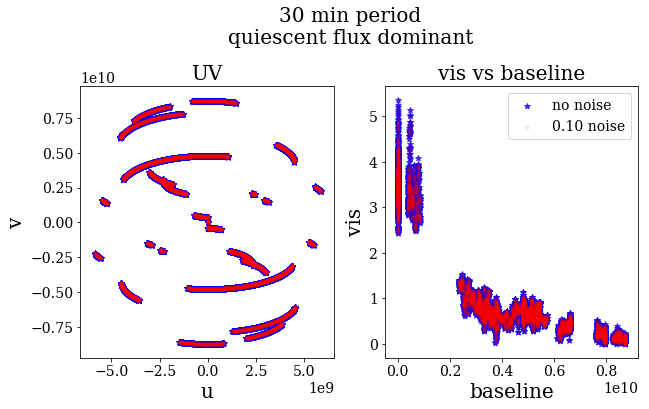

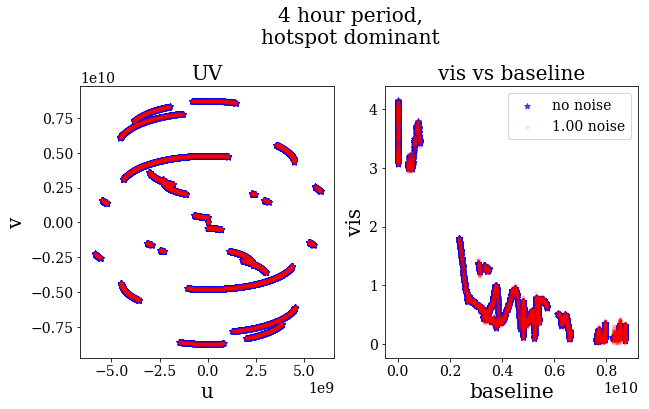

In [16]:
# now add some noise in to the observation 
# we don't have animations for the noisy version since the noise is added post-observation
obs1 = no_noise_obs1
noise_factor= 0.1 # you can vary the noise_factor
with_noise_obs1 = add_noise(no_noise_obs1, noisy_obs, noise_factor) 
obs2 = with_noise_obs1

fig = plt.figure(figsize=[10,5])
fig.suptitle('30 min period'+'\n'+'quiescent flux dominant', size=20, y=1.1)
gs = gridspec.GridSpec(1,2)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax1.set_title('UV')
ax2.set_title('vis vs baseline')
ax1.scatter(obs1.data['u'], obs1.data['v'],c='b', alpha=0.75, marker='*')
ax1.scatter(-obs1.data['u'], -obs1.data['v'], c='b', alpha=0.75, marker='*', label='no noise')
ax1.scatter(obs2.data['u'], obs2.data['v'],c='r', alpha=0.1, marker='.')
ax1.scatter(-obs2.data['u'], -obs2.data['v'], c='r', alpha=0.1, marker='.', label='with noise')
ax1.set_xlabel('u')
ax1.set_ylabel('v')
ax2.scatter(np.sqrt(obs1.data['u']**2 + obs1.data['v']**2), np.abs(obs1.data['vis']),c='b', alpha=0.75, marker='*',label='no noise')
ax2.scatter(np.sqrt(obs2.data['u']**2 + obs2.data['v']**2), np.abs(obs2.data['vis']),c='r', alpha=0.1, marker='.',label='{0:.2f} noise'.format(noise_factor))
ax2.set_ylabel('vis')
ax2.set_xlabel('baseline')
plt.legend()
plt.show()

obs1 = no_noise_obs2
noise_factor=1.0 # you can vary the noise_factor
with_noise_obs2 = add_noise(no_noise_obs2, noisy_obs, noise_factor) 
obs2 = with_noise_obs2

fig = plt.figure(figsize=[10,5])
fig.suptitle('4 hour period,'+'\n'+'hotspot dominant', size=20, y=1.1)
gs = gridspec.GridSpec(1,2)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax1.set_title('UV')
ax2.set_title('vis vs baseline')
ax1.scatter(obs1.data['u'], obs1.data['v'],c='b', alpha=0.75, marker='*')
ax1.scatter(-obs1.data['u'], -obs1.data['v'], c='b', alpha=0.75, marker='*', label='no noise')
ax1.scatter(obs2.data['u'], obs2.data['v'],c='r', alpha=0.1, marker='.')
ax1.scatter(-obs2.data['u'], -obs2.data['v'], c='r', alpha=0.1, marker='.', label='with noise')
ax1.set_xlabel('u')
ax1.set_ylabel('v')
ax2.scatter(np.sqrt(obs1.data['u']**2 + obs1.data['v']**2), np.abs(obs1.data['vis']),c='b', alpha=0.7, marker='*',label='no noise')
ax2.scatter(np.sqrt(obs2.data['u']**2 + obs2.data['v']**2), np.abs(obs2.data['vis']),c='r', alpha=0.1, marker='.',label='{0:.2f} noise'.format(noise_factor))
ax2.set_ylabel('vis')
ax2.set_xlabel('baseline')
plt.legend()
plt.show()

In [17]:
# this is an easy way to save/read your test observations
with_noise_obs1.save_uvfits('test.uvfits') # export to uvfits 
test_obs = eh.obsdata.load_uvfits('test.uvfits') # and to load it back in 

Building NX table
No NX table in saved uvfits

Loading uvfits:  test.uvfits
no IF in uvfits header!
Number of uvfits Correlation Products: 4
No NX table in uvfits!


In [18]:
test_obs = eh.obsdata.load_uvfits('test.uvfits') # and to load it back in 


Loading uvfits:  test.uvfits
no IF in uvfits header!
Number of uvfits Correlation Products: 4
No NX table in uvfits!


# generate_toy_data()

In [19]:
# Runs through the walkthrough in a single function, if you need to generate many test cases. 
# Requires '../data/interim/pixel_dict.pkl' and '../data/interim/trimmed_sim.h5' 
help(generate_toy_data)

Help on function generate_toy_data in module local_tools.generation:

generate_toy_data(vex, export_name='../data/generated/test.uvfits', movie_duration=60, mean_flux=3.5, hotspot_period=15, hotspot_ratio=0.1, hotspot_offset=0.0, noise_factor=0.0, constant_sim=False, save_movie=False)
    Runs through the walkthrough in a single function, if you need to generate many test cases. 
    Requires '../data/interim/pixel_dict.pkl' and '../data/interim/trimmed_sim.h5' 
    both are generated in 0_data_prep.ipynb
    
    args:
    vex                vex observation file (see 1_walkthrough.ipynb)
    export_name        the uvfits file name to be saved
    movie_duration     in seconds
    mean_flux          in Jy
    hotspot_period     in seconds
    hotspot_ratio      the ratio of hotspot to quiescent flux; 0.0 gives no hotspot, 1.0 gives only hotspot
    hotspot_offset     float fraction of cycle to offset the phase of the hotspot (see 1_walkthrough.ipynb)
    noise_factor       multiplicati

In [20]:
def quick_plot(filename):
    fig = plt.figure(figsize=(15,5))
    gs = gridspec.GridSpec(ncols=2, nrows=1, width_ratios=[5,5], height_ratios=[5])
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    fig.tight_layout()
    st = fig.suptitle(filename)
    obs = eh.obsdata.load_uvfits(filename)
    ax1.scatter(obs.data['time'], np.abs(obs.data['vis']))
    ax1.set_ylabel('vis')
    ax1.set_xlabel('time')
    ax2.scatter(np.sqrt(obs.data['u']**2 + obs.data['v']**2), np.abs(obs.data['vis']),c='b', alpha=0.75, marker='.')
    ax2.set_ylabel('vis')
    ax2.set_xlabel('baseline')
    st.set_y(0.95)
    fig.subplots_adjust(top=0.85)
    plt.show()
    return(obs)

In [21]:
# load in and process vex file
vex = eh.io.load.load_vex('../data/raw/testa.vex') 
movie_duration = 10 * 60 * 60 
continuous_vex = make_vex_continuous(vex)
scaled_continuous_vex = scale_vex_obstime(continuous_vex, movie_duration)


Loading vexfile:  ../data/raw/testa.vex


# data generation example

In [22]:
%%capture

folder = '../data/generated/'
main_directory = 'continuous_diff_periods_vexA/'
subdir = '0.1noise/'
pathname = folder+main_directory+subdir
if not os.path.exists(folder+main_directory):
    os.makedirs(folder+main_directory)
if not os.path.exists(pathname):
    os.makedirs(pathname)
    
noise_factor = 0.1
hotspot_offset = 0.0
hotspot_ratio = 0.5
mean_flux = 3.5
    
for period in np.geomspace(start=3, stop=60, num=10): # this gives geometrically spaced periods bw 3 min and 60 min
    f = pathname+'data_{0:.3f}min_{1:.2f}noise_{2:.2f}ratio.uvfits'.format(period, noise_factor, hotspot_ratio)
    generate_toy_data(scaled_continuous_vex, f, movie_duration, mean_flux, period*60, \
                  hotspot_ratio, hotspot_offset, noise_factor)
    
    f = pathname+'detrend_{0:.3f}min_{1:.2f}noise_{2:.2f}ratio.uvfits'.format(period, noise_factor, hotspot_ratio)
    generate_toy_data(scaled_continuous_vex, f, movie_duration, mean_flux,period*60, \
                  hotspot_ratio, hotspot_offset, noise_factor, constant_sim = True)
    
    f = pathname+'constant_{0:.3f}min_{1:.2f}noise_0.0ratio.uvfits'.format(period, noise_factor)
    generate_toy_data(scaled_continuous_vex, f, movie_duration, mean_flux,period*60, \
                  0.0, hotspot_offset, noise_factor, constant_sim = True)
    break # only do 1 loop for the example


Loading uvfits:  ../data/generated/continuous_diff_periods_vexA/0.1noise/data_3.000min_0.10noise_0.50ratio.uvfits
no IF in uvfits header!
Number of uvfits Correlation Products: 4
No NX table in uvfits!


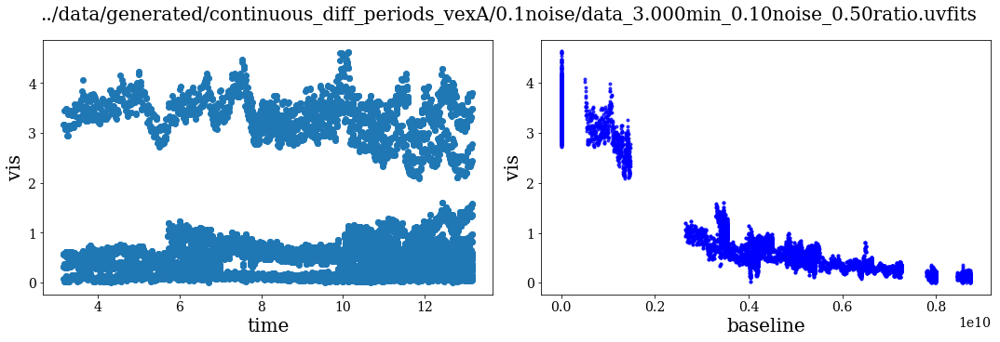


Loading uvfits:  ../data/generated/continuous_diff_periods_vexA/0.1noise/detrend_3.000min_0.10noise_0.50ratio.uvfits
no IF in uvfits header!
Number of uvfits Correlation Products: 4
No NX table in uvfits!


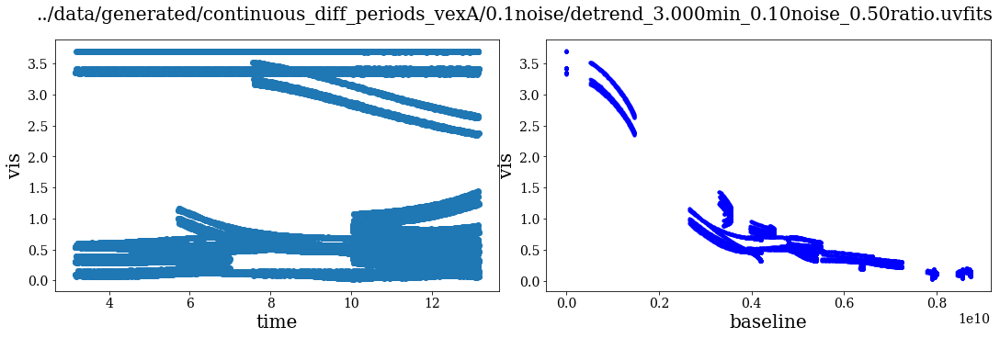


Loading uvfits:  ../data/generated/continuous_diff_periods_vexA/0.1noise/constant_3.000min_0.10noise_0.0ratio.uvfits
no IF in uvfits header!
Number of uvfits Correlation Products: 4
No NX table in uvfits!


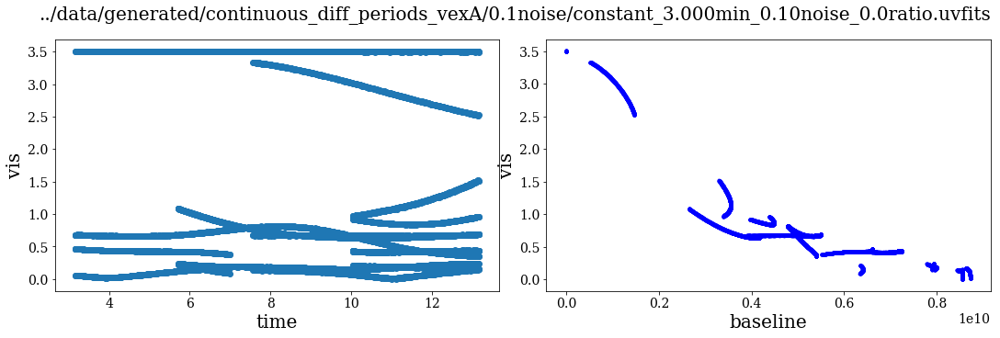

In [23]:
for period in np.geomspace(start=3, stop=60, num=10):
    f = pathname+'data_{0:.3f}min_{1:.2f}noise_{2:.2f}ratio.uvfits'.format(period, noise_factor, hotspot_ratio)
    quick_plot(f)
    
    f = pathname+'detrend_{0:.3f}min_{1:.2f}noise_{2:.2f}ratio.uvfits'.format(period, noise_factor, hotspot_ratio)
    quick_plot(f)
    
    f = pathname+'constant_{0:.3f}min_{1:.2f}noise_0.0ratio.uvfits'.format(period, noise_factor)
    quick_plot(f)
    
    break